## Notebook to score cells based on gene set

attempt to use this functionality for determing scores for
- disease associated microglia (DAM) 
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799
        - "DAM signature (Cst7, Csf1, Lpl, Apoe, Spp1, Cd74, Itgax)"
- senescence
    - Hu Y, Fryatt GL, Ghorbani M et al. Replicative senescence dictates the emergence of disease-associated microglia and contributes to Aβ pathology. Cell Rep 2021;35:109228.
    https://www.sciencedirect.com/science/article/pii/S2211124721005799?via%3Dihub
        - "custom senescence signature (Cdkn2a, Cdkn1a, Cdkn2d, Casp8, Il1b, Glb1, Serpine1)"
    - Dehkordi SK, Walker J, Sah E et al. Profiling senescent cells in human brains reveals neurons with CDKN2D/p19 and tau neuropathology. Nat Aging 2021;1:1107–16.
    https://pubmed.ncbi.nlm.nih.gov/35531351/
        - Canonical Senescence Pathway (CDKN2D, ETS2, RB1, E2F3, CDK6, RBL2, ATM, BMI1, MDM2, CDK4, CCNE1)
        - Senescence Response Pathway (IGFBP7, VIM, FN1, SPARC, IGFBP4, TIMP1, TBX2, TBX3, COL1A1, COL3A1, IGFBP2, TGFB1I1, PTEN, CD44, NFIA, CALR, TIMP2, CXCL8)
        - Senescence Initiating Pathway (SOD1, MAP2K1, GSK3B, PIK3CA, SOD2, MAPK14, IGF1R, TP53BP1, NBN, HRAS, CITED2, CREG1, ABL1, MORC3, NFKB1, AKT1, CDKN1B, EGR1, RBL1, MAP2K6, IGF1, IRF3, PCNA, GADD45A, MAP2K3, IGFBP5, SIRT1, ING1, TGFB1, TERF2)
        - Cell Age (PEBP1, PKM, CKB, AAK1, NUAK1, MAST1, SORBS2, BRAF, SPIN1, MAP2K1, YPEL3, MAPK14, PDPK1, TOP1, ITPK1, MATK, RPS6KA6, SPOP, ITSN2, PDZD2, MAP2K2, LIMK1, DHCR24, PBRM1, MAP3K7, SIN3B, SOX5, EWSR1, PDCD10, CPEB1, NEK4, RB1, MCRS1, PNPT1, HRAS, STK32C, RAF1, ETS2, SMARCB1, FASTK, SLC13A3, TRIM28, MORC3, MAPKAPK5, MAP2K7, STK40, PMVK, CEBPB, GRK6, STAT5B, CDKN1B, PDIK1L, AKT1, MAPK12, MAP2K6, PIAS4, ADCK5, SMURF2, PCGF2, IRF3, PLA2R1, TYK2, ERRFI1, BRD7, ING2, FBXO31, NADK, PTTG1, BHLHE40, ASF1A, ING1, NINJ1, MXD4)

In [1]:
!date

Wed Nov 30 10:10:32 EST 2022


#### import libraries

In [31]:
import scanpy as sc
from anndata import AnnData
from numpy import ndarray
from random import seed, randint
from scipy.stats import zscore, shapiro, kstest, norm
from pandas import DataFrame
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
from seaborn import scatterplot, displot, heatmap
from pandas import read_csv, DataFrame

%matplotlib inline
# for white background of figures (only for docs rendering)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

import warnings
warnings.filterwarnings(action='ignore')

#### set notebook variables

In [3]:
# naming
project = 'aging'

# directories 
wrk_dir = f'/labshare/raph/datasets/adrd_neuro/{project}'
quants_dir = f'{wrk_dir}/demux'
results_dir = f'{wrk_dir}/results'

# in files
in_file = f'{quants_dir}/{project}.pegasus.leiden_085.subclustered.h5ad'
glmmtmb_file = f'{results_dir}/{project}.glmmtmb_age_diffs_fdr.csv'

# variables
DEBUG = True
dpi_value = 50
gene_sets = {'DAM': ['CST7', 'CSF1', 'LPL', 'APOE', 'SPP1', 'CD74', 'ITGAX'],
             'CSS': ['CDKN2A', 'CDKN1A', 'CDKN2D', 'CASO8', 'IL1B', 'GLB1', 'SERPINE1'],
             'CSP': ['CDKN2D', 'ETS2', 'RB1', 'E2F3', 'CDK6', 'RBL2', 'ATM', 
                     'BMI1', 'MDM2', 'CDK4', 'CCNE1'],
             'SRP': ['IGFBP7', 'VIM', 'FN1', 'SPARC', 'IGFBP4', 'TIMP1', 'TBX2', 
                     'TBX3', 'COL1A1', 'COL3A1', 'IGFBP2', 'TGFB1I1', 'PTEN', 
                     'CD44', 'NFIA', 'CALR', 'TIMP2', 'CXCL8'],
             'SIP': ['SOD1', 'MAP2K1', 'GSK3B', 'PIK3CA', 'SOD2', 'MAPK14', 
                     'IGF1R', 'TP53BP1', 'NBN', 'HRAS', 'CITED2', 'CREG1', 
                     'ABL1', 'MORC3', 'NFKB1', 'AKT1', 'CDKN1B', 'EGR1', 
                     'RBL1', 'MAP2K6', 'IGF1', 'IRF3', 'PCNA', 'GADD45A', 
                     'MAP2K3', 'IGFBP5', 'SIRT1', 'ING1', 'TGFB1', 'TERF2'], 
             'CellAge': ['PEBP1', 'PKM', 'CKB', 'AAK1', 'NUAK1', 'MAST1', 
                         'SORBS2', 'BRAF', 'SPIN1', 'MAP2K1', 'YPEL3', 'MAPK14', 
                         'PDPK1', 'TOP1', 'ITPK1', 'MATK', 'RPS6KA6', 'SPOP', 
                         'ITSN2', 'PDZD2', 'MAP2K2', 'LIMK1', 'DHCR24', 'PBRM1', 
                         'MAP3K7', 'SIN3B', 'SOX5', 'EWSR1', 'PDCD10', 'CPEB1', 
                         'NEK4', 'RB1', 'MCRS1', 'PNPT1', 'HRAS', 'STK32C', 'RAF1', 
                         'ETS2', 'SMARCB1', 'FASTK', 'SLC13A3', 'TRIM28', 'MORC3', 
                         'MAPKAPK5', 'MAP2K7', 'STK40', 'PMVK', 'CEBPB', 'GRK6', 
                         'STAT5B', 'CDKN1B', 'PDIK1L', 'AKT1', 'MAPK12', 'MAP2K6', 
                         'PIAS4', 'ADCK5', 'SMURF2', 'PCGF2', 'IRF3', 'PLA2R1', 
                         'TYK2', 'ERRFI1', 'BRD7', 'ING2', 'FBXO31', 'NADK', 'PTTG1', 
                         'BHLHE40', 'ASF1A', 'ING1', 'NINJ1', 'MXD4']}
exclude_cell_types = ['uncertain', 'uncertain-2', 'uncertain-3', 'Astrocyte-GFAP-Hi']
seed(42)

#### utilitiy functions

In [4]:
def test_score_normality(scores):
    stat, p = shapiro(scores)
    if p > 0.05:
        print(f'by Shapiro is Gaussian p={p}, stat={stat}')
    else:
        print(f'by Shapiro is not Gaussian p={p}, stat={stat}')
    stat, p = kstest(scores, norm.cdf)
    if p > 0.05:
        print(f'by Kolmogorov-Smirnov is Gaussian p={p}, stat={stat}')
    else:
        print(f'by Kolmogorov-Smirnov is not Gaussian p={p}, stat={stat}')
    
    
def score_gene_set(data: AnnData, set_name: str, genes: list, iter_cnt: int=100, 
                   num_devs: int=2, verbose: bool=False):
    print(f'scoring {set_name}')
    score_name = f'{set_name}_score'
    scores = ndarray(shape=(data.obs.shape[0], iter_cnt), dtype=float)
    print('bootstrapping score_genes', end='.')
    for index in range(0, iter_cnt):
        print(index, end='.')
        genes = list(set(gene_sets[set_name]) & set(data.var.index))
        temp_data = sc.tl.score_genes(data, genes, score_name=score_name, 
                                      copy=True, random_state=randint(0, 9999))
        scores[:,index] = temp_data.obs[score_name]
    data.obs[score_name] = scores.mean(axis=1)
    # binarize score
    data.obs[f'is{set_name}'] = zscore(scores.mean(axis=1)) > num_devs
    # test normality of score
    test_score_normality(data.obs[score_name])
    # plot score distribution
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        displot(x=score_name, data=data.obs, kind='kde')
    # plot standardized score distribution
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        displot(x=zscore(scores.mean(axis=1)), kind='kde')
        plt.show()
    
    data.obs[f'is{set_name}'].replace({True: set_name, False: f'non{set_name}'}, inplace=True)
    # find proportion of total cells where condition exists
    positive_cnt = data.obs.loc[data.obs[f'is{set_name}'] == set_name].shape[0]
    total_cnt = data.obs.shape[0]
    positive_frac = round(positive_cnt/total_cnt, 3)
    print(f'\nFractions of cells positive for {set_name} is {positive_frac} or \
{positive_cnt} of {total_cnt}')        
    print('visualizing', end='.')
    
    # show positive cells by Age
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        scatterplot(x='Age', y=score_name, data=data.obs, hue=f'is{set_name}')    
    # show dotplots of genes by cell-type and age group
    this_set = list(set(genes) & set(data.var.index))
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='new_anno', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby='Age_group', 
                      mean_only_expressed=True)
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.dotplot(data, this_set, groupby=f'is{set_name}', 
                      mean_only_expressed=True)
        
    # visualize umap of positive cells and score
    pos_data = data[data.obs[f'is{set_name}'] == set_name]
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.umap(pos_data, color=['new_anno', score_name], legend_loc='on data')
    # visualize binarized score
    sc.tl.embedding_density(data, groupby=f'is{set_name}')
    with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
        plt.style.use('seaborn-bright')
        sc.pl.embedding_density(data, groupby=f'is{set_name}')
        
    # get counts by cell-type and brain region
    display(data.obs.groupby('new_anno')[f'is{set_name}'].value_counts())
    display(data.obs.groupby('Brain_region')[f'is{set_name}'].value_counts())    

### read the anndata (h5ad) file

In [5]:
%%time
adata = sc.read(in_file, cache=True)
print(adata)

Only considering the two last: ['.subclustered', '.h5ad'].
Only considering the two last: ['.subclustered', '.h5ad'].
AnnData object with n_obs × n_vars = 167945 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle',

### Plot the clusters

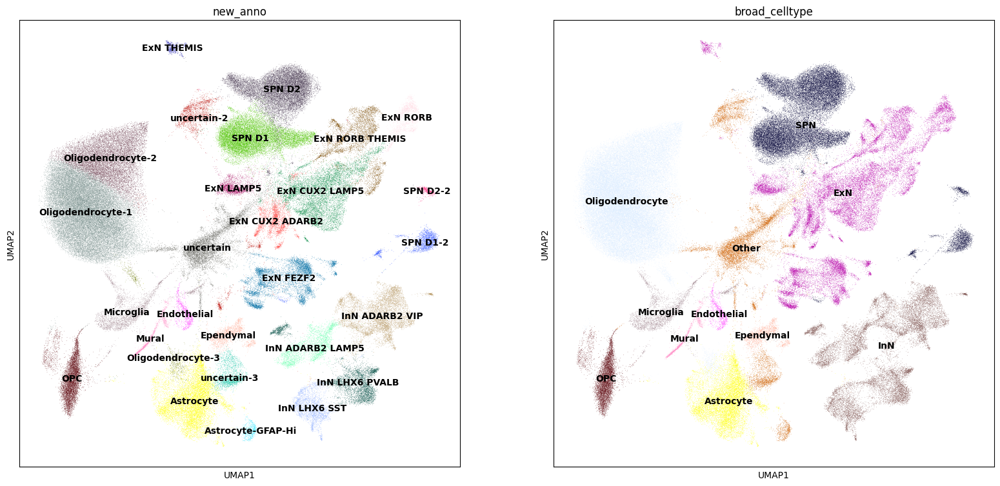

In [6]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [7]:
adata.obs.broad_celltype.value_counts()

Oligodendrocyte      50129
SPN                  33512
ExN                  28483
InN                  17733
Other                12753
Astrocyte            11289
OPC                   6682
Microglia             3265
Ependymal             1853
Mural                 1293
Endothelial            953
ExN LAMP5                0
SPN D2                   0
ExN CUX2 ADARB2          0
ExN CUX2 LAMP5           0
ExN FEZF2                0
uncertain-3              0
Oligodendrocyte-3        0
uncertain-2              0
uncertain                0
SPN D2-2                 0
SPN D1-2                 0
ExN RORB                 0
SPN D1                   0
Radial Glia              0
Astrocyte-GFAP-Hi        0
Oligodendrocyte-1        0
InN LHX6 SST             0
InN LHX6 PVALB           0
InN ADARB2 VIP           0
InN ADARB2 LAMP5         0
ExN THEMIS               0
ExN RORB THEMIS          0
Oligodendrocyte-2        0
Name: broad_celltype, dtype: int64

### remove cell-types that are known excludes

In [8]:
adata = adata[~adata.obs.new_anno.isin(exclude_cell_types)]
print(adata)

View of AnnData object with n_obs × n_vars = 155192 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'X_umap_085'
    varm: 'de_res', 'gmeans', 'gstds', 'means', 'pa

### replot the clusters without the excluded celltypes

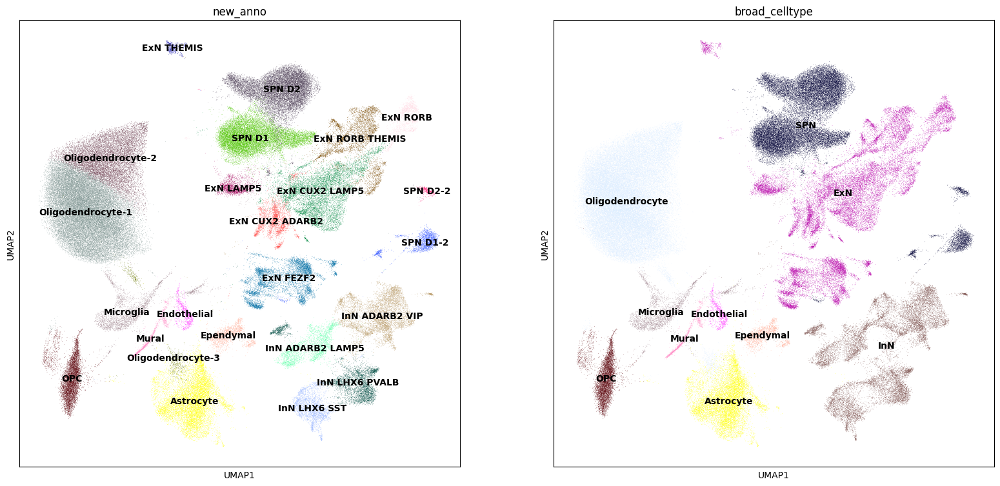

In [9]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.umap(adata, color=['new_anno', 'broad_celltype'], legend_loc='on data')

In [10]:
adata.obs.new_anno.value_counts()

Oligodendrocyte-1    36479
SPN D1               15379
SPN D2               15280
Oligodendrocyte-2    12844
Astrocyte            11289
ExN CUX2 LAMP5        9055
InN ADARB2 VIP        7014
ExN FEZF2             6842
OPC                   6682
ExN RORB THEMIS       5130
InN LHX6 PVALB        4566
Microglia             3265
InN ADARB2 LAMP5      3216
ExN CUX2 ADARB2       3066
InN LHX6 SST          2937
SPN D1-2              2388
ExN RORB              1966
ExN LAMP5             1963
Ependymal             1853
Mural                 1293
Endothelial            953
Oligodendrocyte-3      806
SPN D2-2               465
ExN THEMIS             461
Name: new_anno, dtype: int64

### generate density plot for brain region

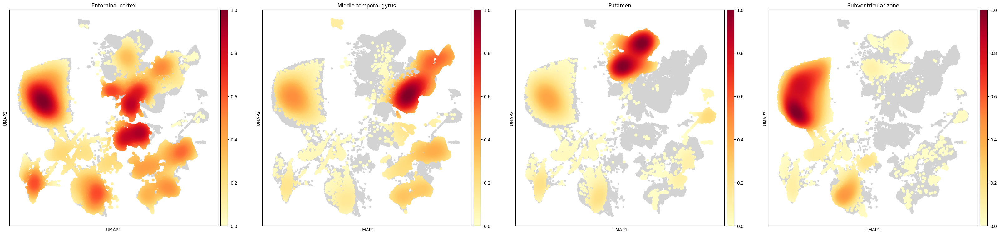

In [11]:
sc.tl.embedding_density(adata, groupby='Brain_region')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Brain_region')

### generate density plot for age group

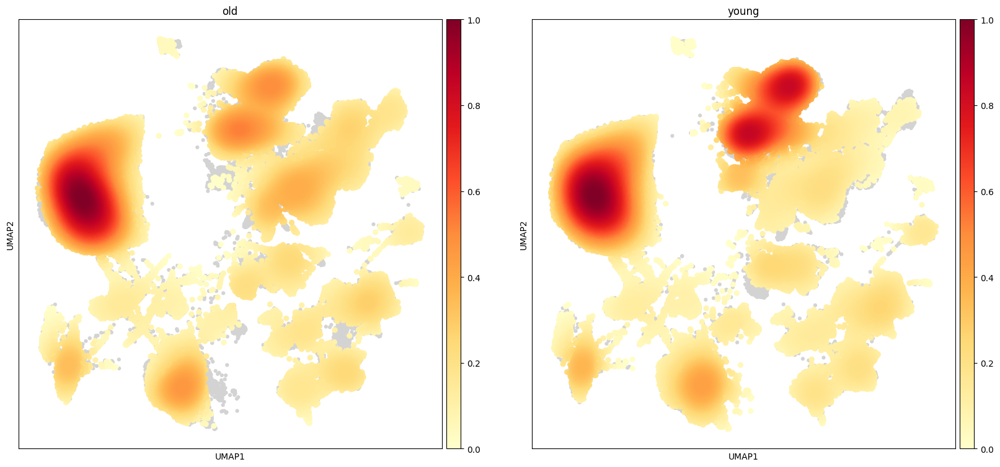

In [12]:
sc.tl.embedding_density(adata, groupby='Age_group')
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': dpi_value}):
    plt.style.use('seaborn-bright')
    sc.pl.embedding_density(adata, groupby='Age_group')

### score the DAM

AnnData object with n_obs × n_vars = 3265 × 35441
    obs: 'pool_name', 'Sample_id', 'Tissue_source', 'Brain_region', 'Clinical_diagnosis', 'Age', 'Sex', 'donor_id', 'lane_num', 'Channel', 'n_genes', 'n_counts', 'percent_mito', 'scale', 'Group', 'leiden_labels', 'anno', 'leiden_labels_085', 'new_anno', 'Age_group', 'broad_celltype', 'umap_density_Brain_region', 'umap_density_Age_group'
    var: 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'Channels', 'Groups', 'PCs', 'W_diffmap', 'W_pca_harmony', 'broad_celltype_colors', 'c2gid', 'df_qcplot', 'diffmap_evals', 'diffmap_knn_distances', 'diffmap_knn_indices', 'genome', 'gncells', 'leiden_resolution', 'modality', 'ncells', 'new_anno_colors', 'norm_count', 'pca', 'pca_features', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std', 'umap_density_Brain_region_params', 'umap_density_Age_group_params'
    obsm: 'X_diffmap', 'X_f

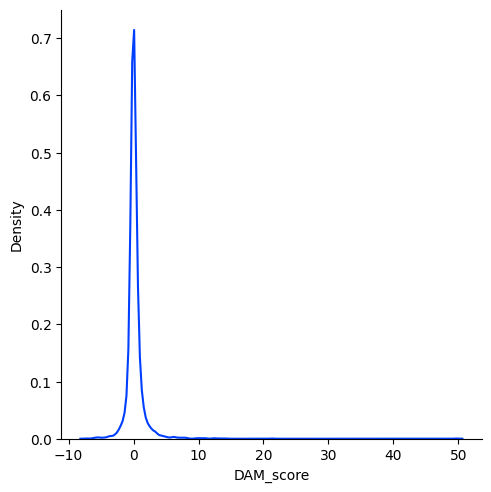

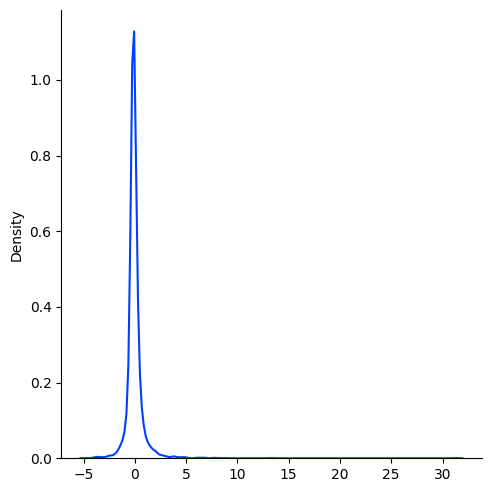


Fractions of cells positive for DAM is 0.055 or 178 of 3265
visualizing.

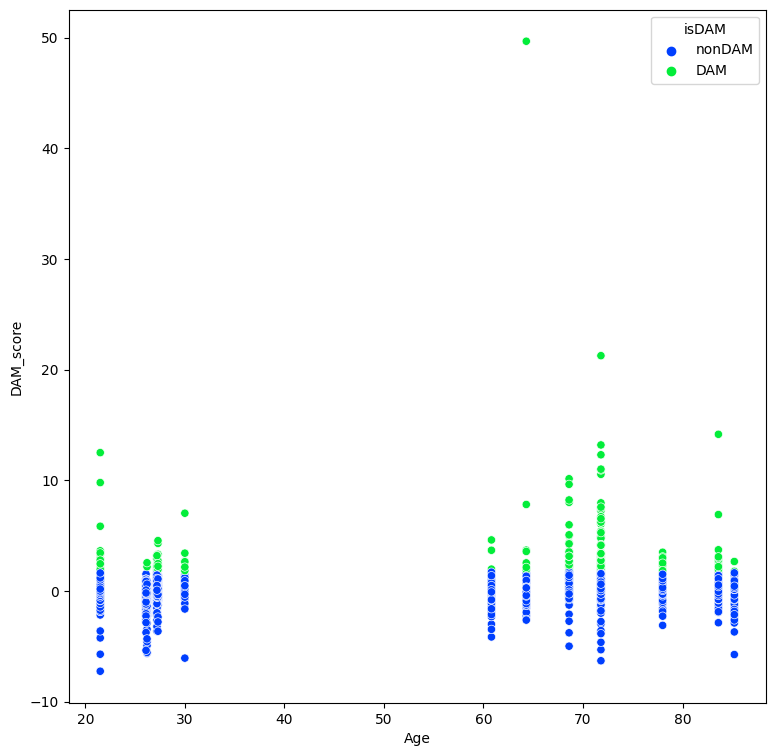

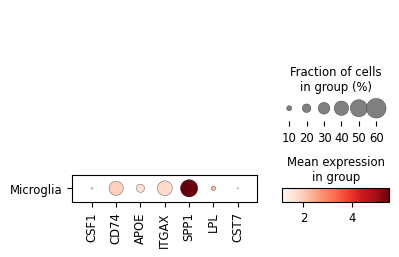

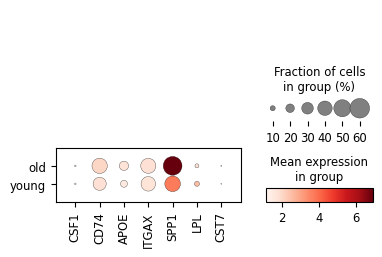

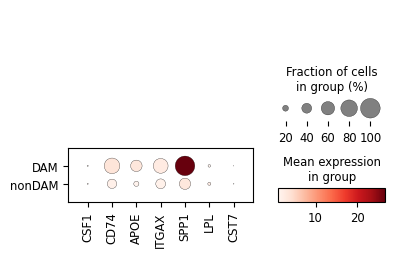

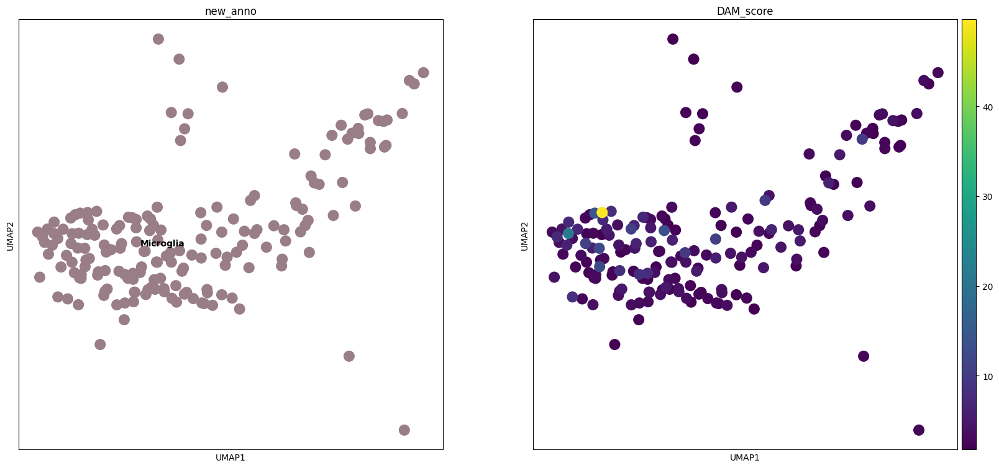

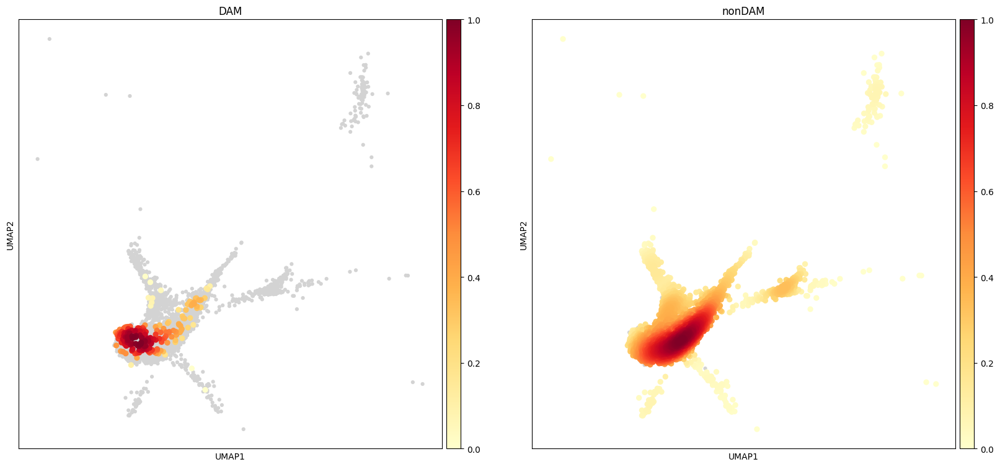

new_anno         
Microglia  nonDAM    3087
           DAM        178
Name: isDAM, dtype: int64

Brain_region                 
Entorhinal cortex      nonDAM    1210
                       DAM          9
Middle temporal gyrus  nonDAM     256
                       DAM          2
Putamen                nonDAM     661
                       DAM          9
Subventricular zone    nonDAM     960
                       DAM        158
Name: isDAM, dtype: int64

CPU times: user 32 s, sys: 2.07 s, total: 34.1 s
Wall time: 23.1 s


In [13]:
%%time
mg_data = adata[adata.obs.broad_celltype == 'Microglia'].copy()
print(mg_data)
score_gene_set(mg_data, 'DAM', gene_sets['DAM'], num_devs=1, verbose=DEBUG)

### score the CSS, custom senescence signature

scoring CSS
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.6800997257232666
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.357629570972962


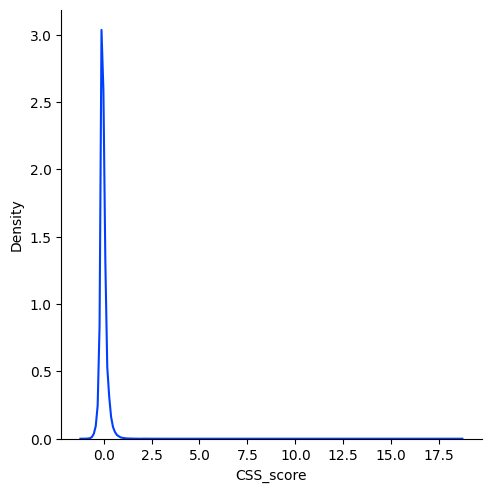

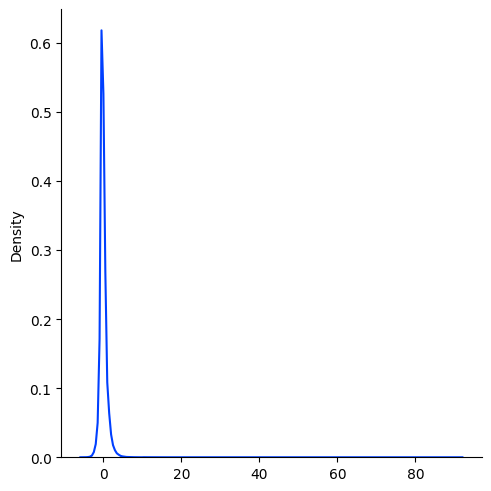


Fractions of cells positive for CSS is 0.029 or 4536 of 155192
visualizing.

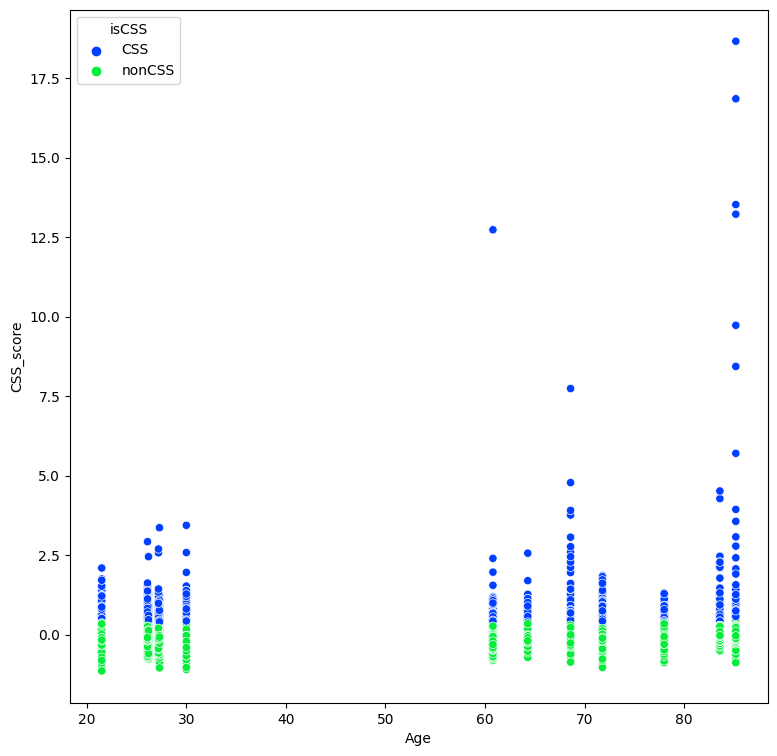

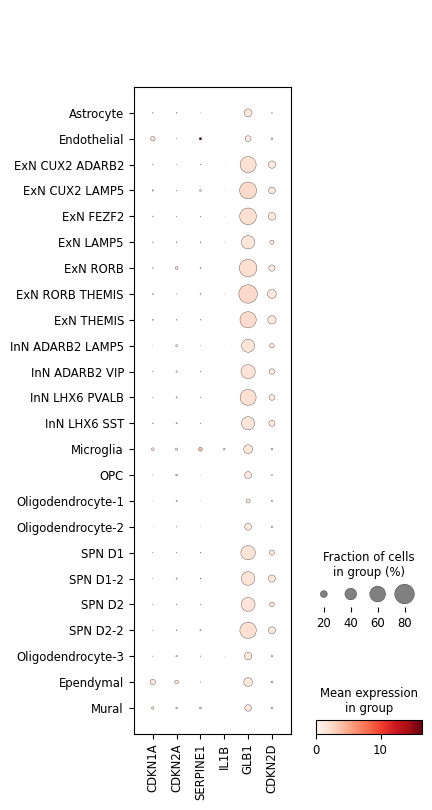

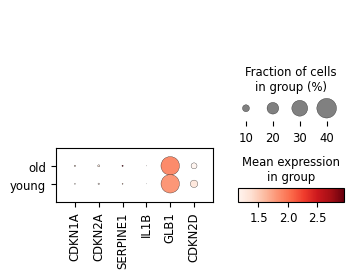

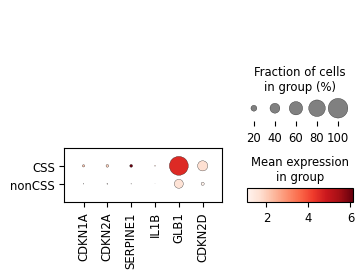

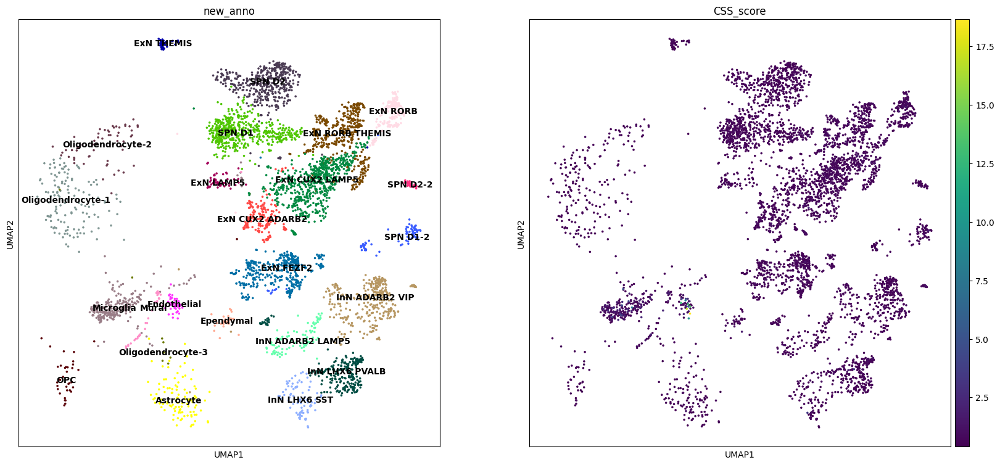

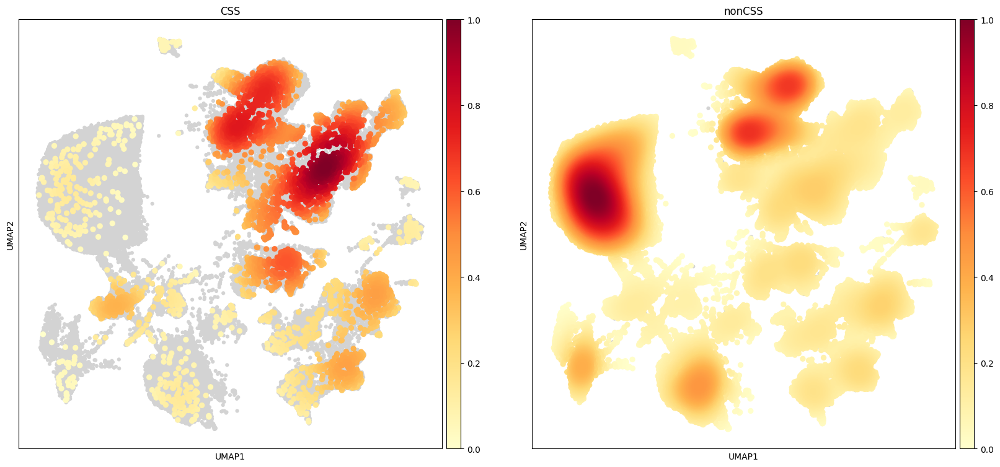

new_anno                 
Astrocyte          nonCSS    11182
                   CSS         107
Endothelial        nonCSS      908
                   CSS          45
ExN CUX2 ADARB2    nonCSS     2873
                   CSS         193
ExN CUX2 LAMP5     nonCSS     8384
                   CSS         671
ExN FEZF2          nonCSS     6419
                   CSS         423
ExN LAMP5          nonCSS     1910
                   CSS          53
ExN RORB           nonCSS     1779
                   CSS         187
ExN RORB THEMIS    nonCSS     4713
                   CSS         417
ExN THEMIS         nonCSS      421
                   CSS          40
InN ADARB2 LAMP5   nonCSS     3120
                   CSS          96
InN ADARB2 VIP     nonCSS     6671
                   CSS         343
InN LHX6 PVALB     nonCSS     4313
                   CSS         253
InN LHX6 SST       nonCSS     2854
                   CSS          83
Microglia          nonCSS     3025
                   CSS       

Brain_region                 
Entorhinal cortex      nonCSS    46088
                       CSS        1468
Middle temporal gyrus  nonCSS    23965
                       CSS        1429
Putamen                nonCSS    45446
                       CSS        1043
Subventricular zone    nonCSS    35157
                       CSS         596
Name: isCSS, dtype: int64

CPU times: user 15min 50s, sys: 1min 54s, total: 17min 45s
Wall time: 17min


In [14]:
%%time
score_gene_set(adata, 'CSS', gene_sets['CSS'], verbose=DEBUG)

### score the CSP, Canonical Senescence Pathway

scoring CSP
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.887403130531311
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.2906364955559033


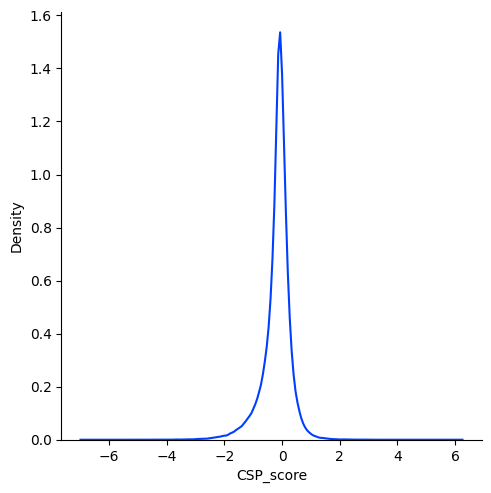

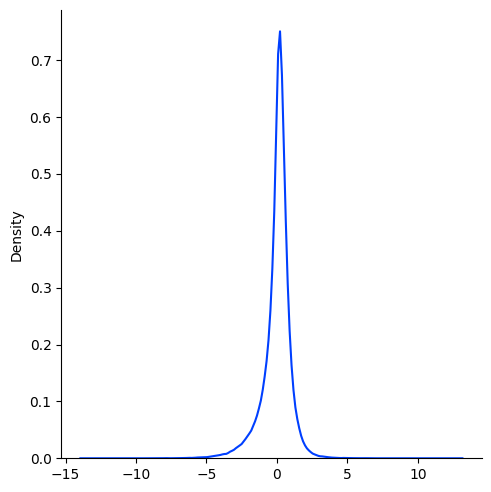


Fractions of cells positive for CSP is 0.014 or 2097 of 155192
visualizing.

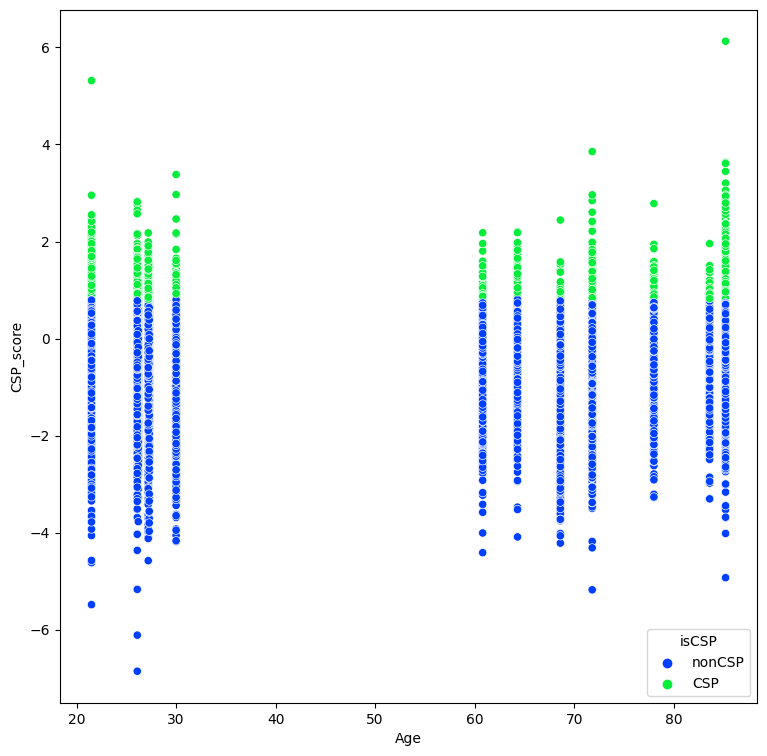

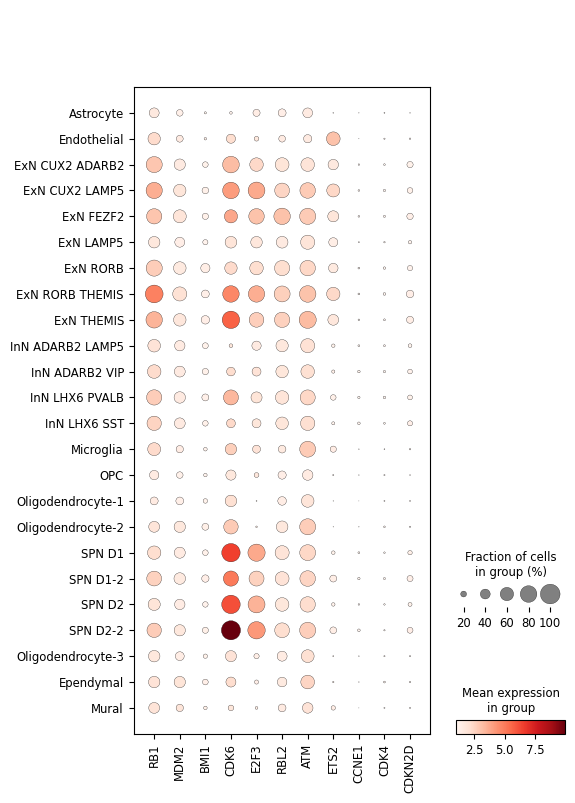

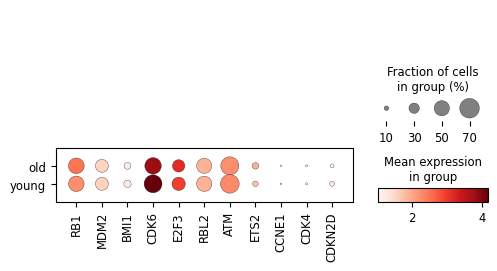

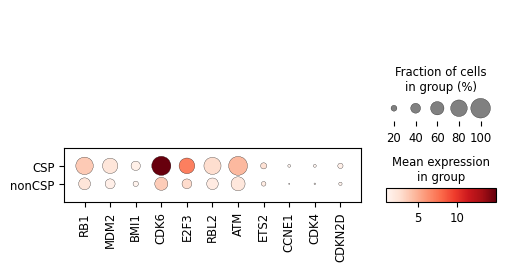

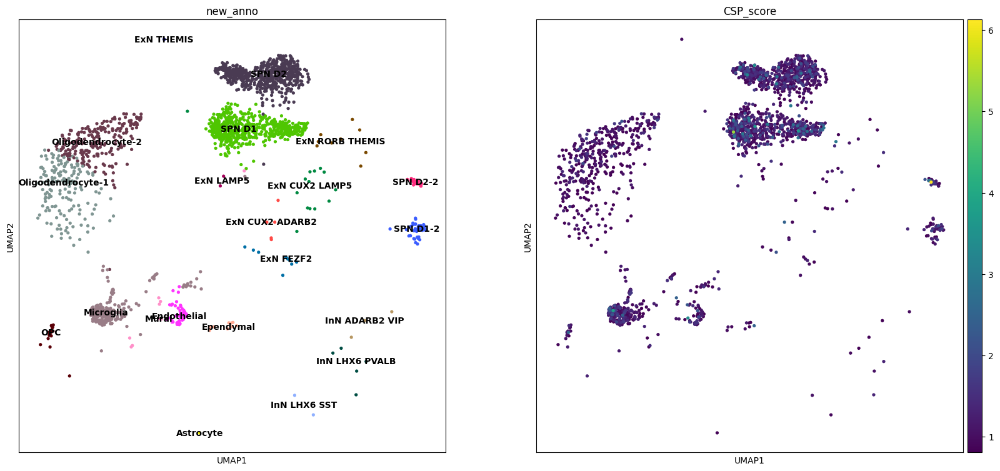

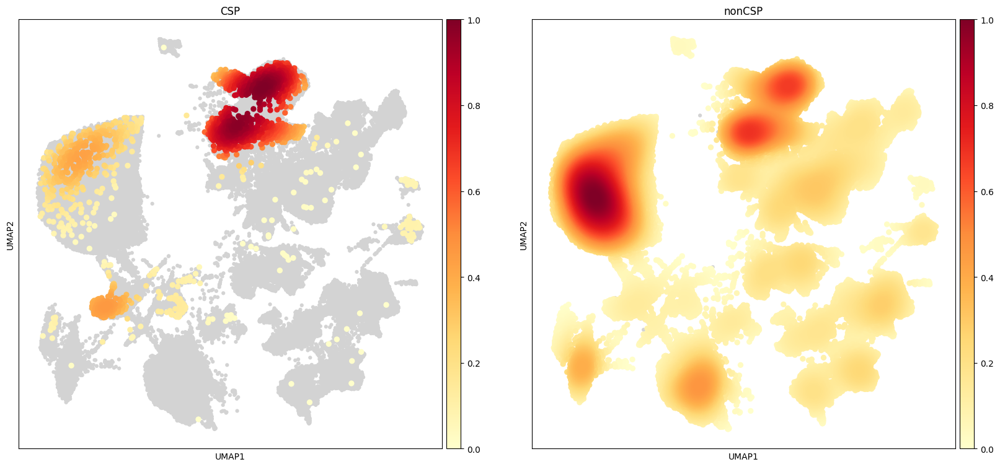

new_anno                 
Astrocyte          nonCSP    11288
                   CSP           1
Endothelial        nonCSP      901
                   CSP          52
ExN CUX2 ADARB2    nonCSP     3061
                   CSP           5
ExN CUX2 LAMP5     nonCSP     9041
                   CSP          14
ExN FEZF2          nonCSP     6833
                   CSP           9
ExN LAMP5          nonCSP     1961
                   CSP           2
ExN RORB           nonCSP     1966
                   CSP           0
ExN RORB THEMIS    nonCSP     5121
                   CSP           9
ExN THEMIS         nonCSP      460
                   CSP           1
InN ADARB2 LAMP5   nonCSP     3216
                   CSP           0
InN ADARB2 VIP     nonCSP     7011
                   CSP           3
InN LHX6 PVALB     nonCSP     4561
                   CSP           5
InN LHX6 SST       nonCSP     2935
                   CSP           2
Microglia          nonCSP     3023
                   CSP       

Brain_region                 
Entorhinal cortex      nonCSP    47452
                       CSP         104
Middle temporal gyrus  nonCSP    25331
                       CSP          63
Putamen                nonCSP    45277
                       CSP        1212
Subventricular zone    nonCSP    35035
                       CSP         718
Name: isCSP, dtype: int64

CPU times: user 16min 15s, sys: 1min 54s, total: 18min 9s
Wall time: 17min 30s


In [15]:
%%time
score_gene_set(adata, 'CSP', gene_sets['CSP'], verbose=DEBUG)

### score the SRP, Senescence Response pathway

scoring SRP
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.8544611930847168
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.2943792753391672


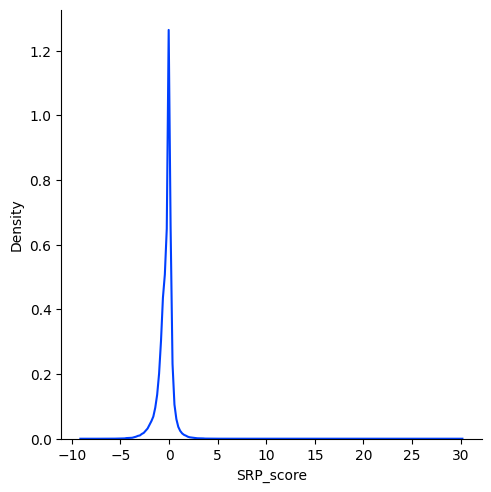

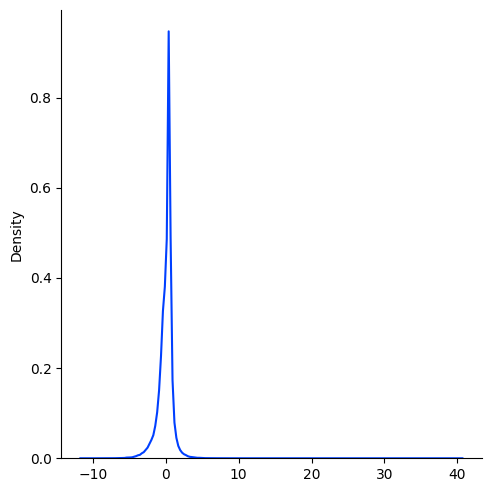


Fractions of cells positive for SRP is 0.015 or 2270 of 155192
visualizing.

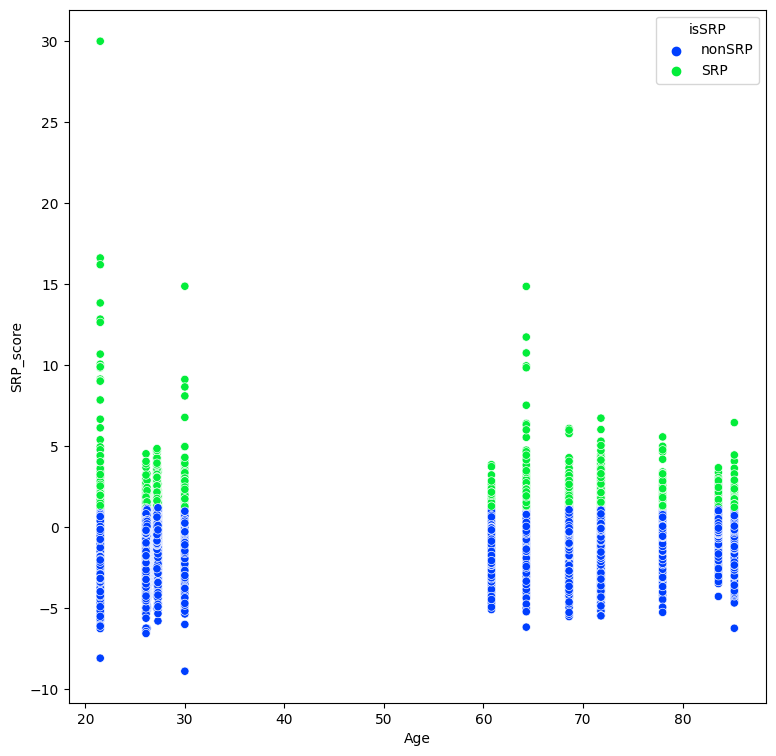

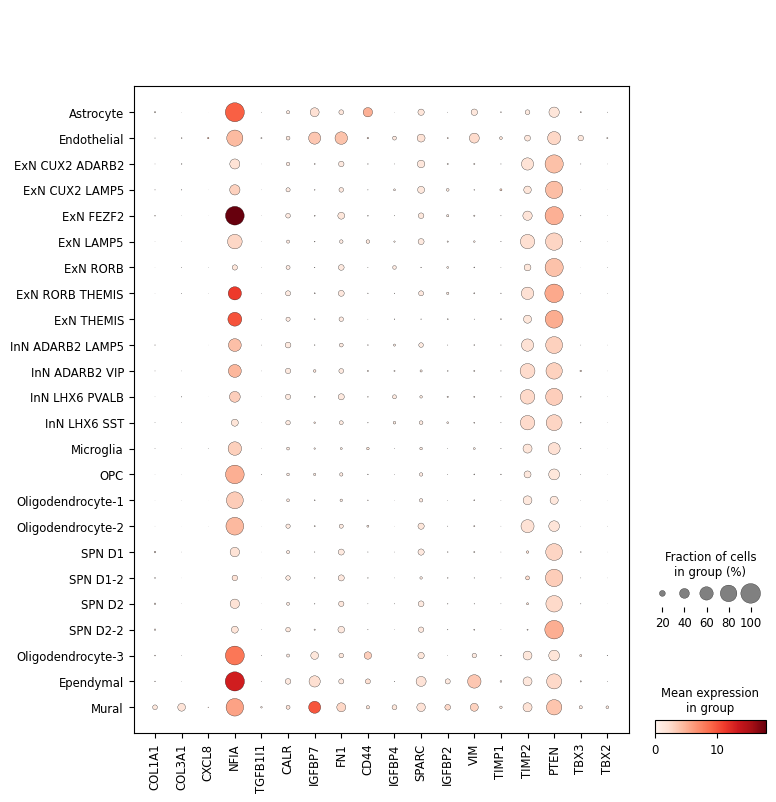

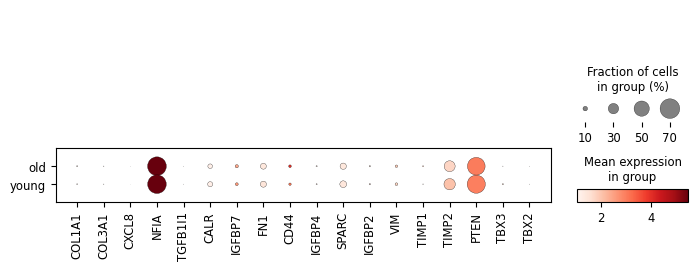

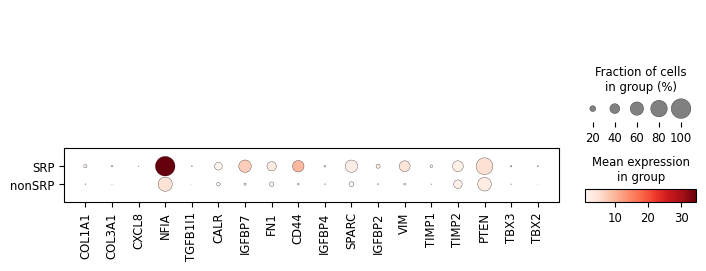

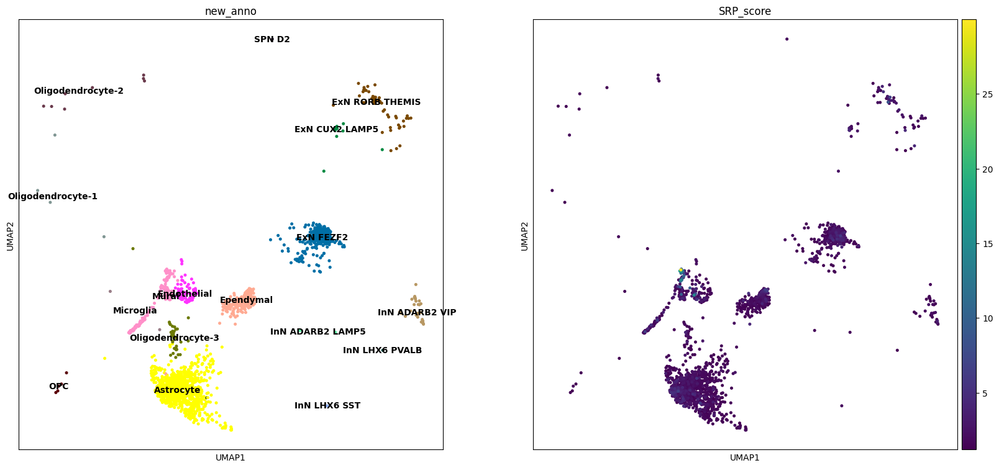

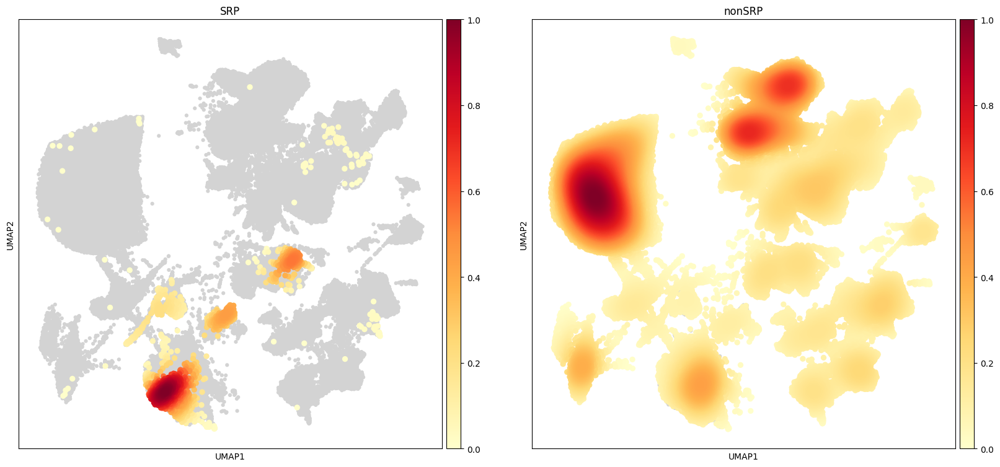

new_anno                 
Astrocyte          nonSRP    10178
                   SRP        1111
Endothelial        nonSRP      871
                   SRP          82
ExN CUX2 ADARB2    nonSRP     3066
                   SRP           0
ExN CUX2 LAMP5     nonSRP     9043
                   SRP          12
ExN FEZF2          nonSRP     6418
                   SRP         424
ExN LAMP5          nonSRP     1963
                   SRP           0
ExN RORB           nonSRP     1966
                   SRP           0
ExN RORB THEMIS    nonSRP     5077
                   SRP          53
ExN THEMIS         nonSRP      461
                   SRP           0
InN ADARB2 LAMP5   nonSRP     3214
                   SRP           2
InN ADARB2 VIP     nonSRP     6985
                   SRP          29
InN LHX6 PVALB     nonSRP     4565
                   SRP           1
InN LHX6 SST       nonSRP     2936
                   SRP           1
Microglia          nonSRP     3263
                   SRP       

Brain_region                 
Entorhinal cortex      nonSRP    46975
                       SRP         581
Middle temporal gyrus  nonSRP    25202
                       SRP         192
Putamen                nonSRP    46314
                       SRP         175
Subventricular zone    nonSRP    34431
                       SRP        1322
Name: isSRP, dtype: int64

CPU times: user 16min 19s, sys: 1min 51s, total: 18min 11s
Wall time: 17min 31s


In [16]:
%%time
score_gene_set(adata, 'SRP', gene_sets['SRP'], verbose=DEBUG)

### score the SIP, Senescence Initiating pathway

scoring SIP
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.8594400882720947
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.38539285116115096


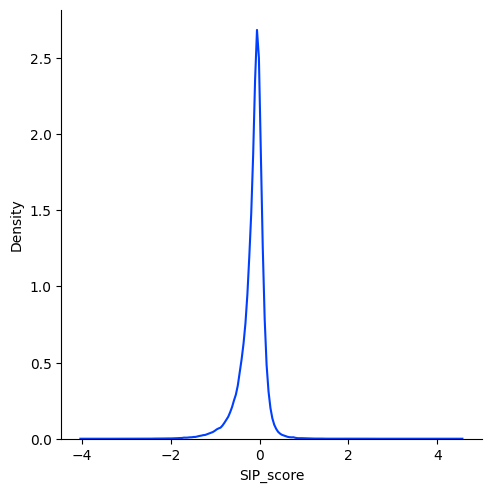

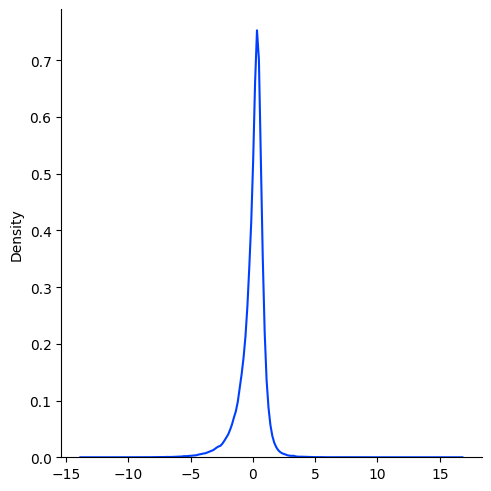


Fractions of cells positive for SIP is 0.009 or 1392 of 155192
visualizing.

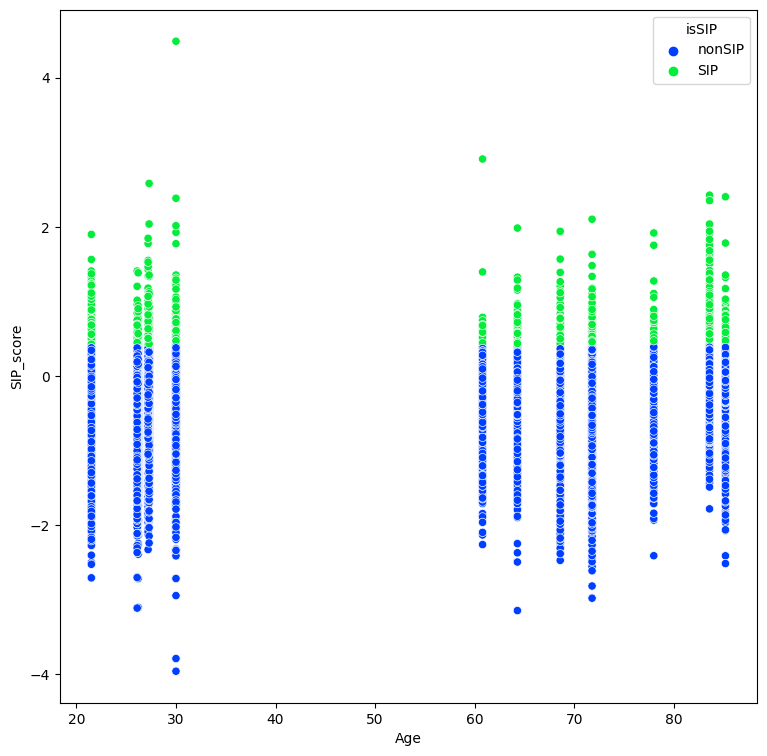

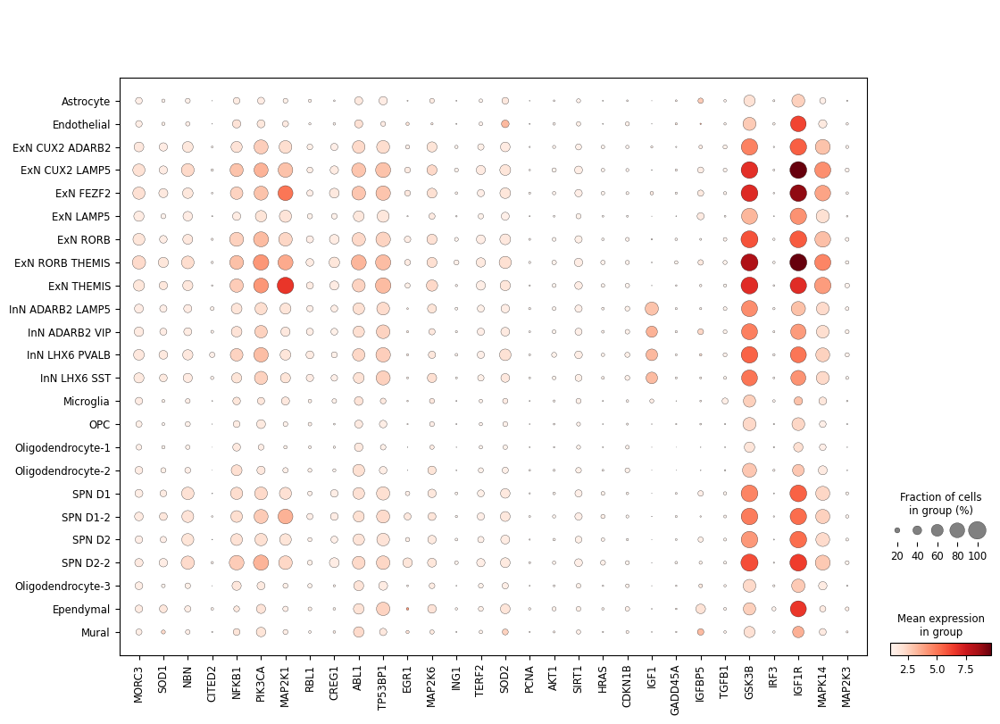

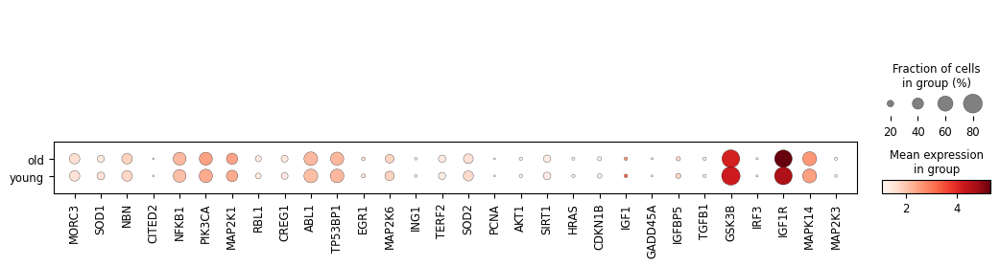

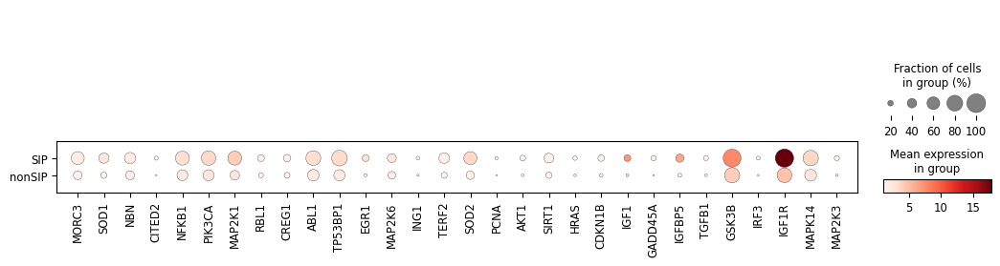

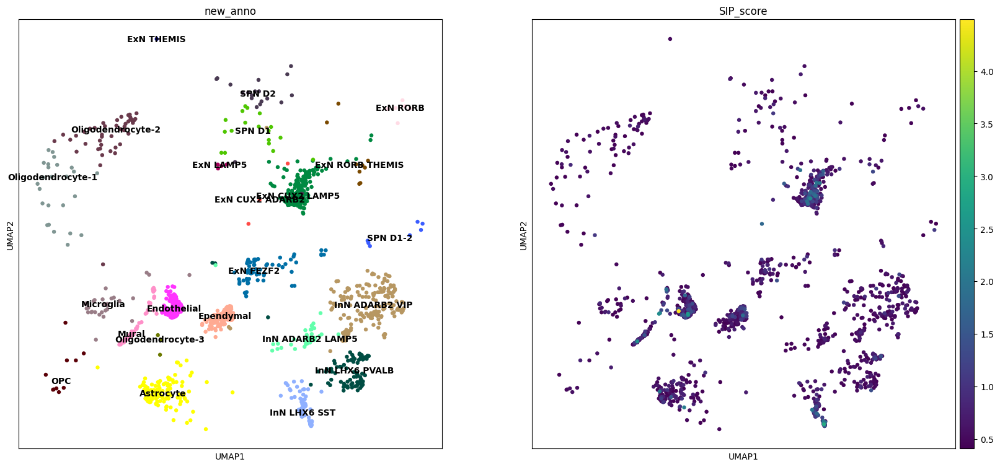

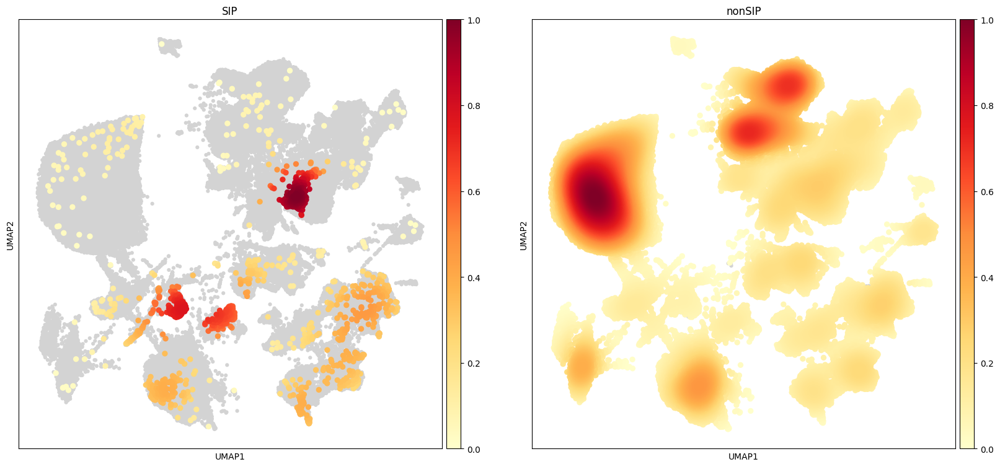

new_anno                 
Astrocyte          nonSIP    11172
                   SIP         117
Endothelial        nonSIP      803
                   SIP         150
ExN CUX2 ADARB2    nonSIP     3063
                   SIP           3
ExN CUX2 LAMP5     nonSIP     8776
                   SIP         279
ExN FEZF2          nonSIP     6773
                   SIP          69
ExN LAMP5          nonSIP     1959
                   SIP           4
ExN RORB           nonSIP     1960
                   SIP           6
ExN RORB THEMIS    nonSIP     5121
                   SIP           9
ExN THEMIS         nonSIP      460
                   SIP           1
InN ADARB2 LAMP5   nonSIP     3177
                   SIP          39
InN ADARB2 VIP     nonSIP     6844
                   SIP         170
InN LHX6 PVALB     nonSIP     4480
                   SIP          86
InN LHX6 SST       nonSIP     2838
                   SIP          99
Microglia          nonSIP     3235
                   SIP       

Brain_region                 
Entorhinal cortex      nonSIP    47217
                       SIP         339
Middle temporal gyrus  nonSIP    24925
                       SIP         469
Putamen                nonSIP    46362
                       SIP         127
Subventricular zone    nonSIP    35296
                       SIP         457
Name: isSIP, dtype: int64

CPU times: user 16min 31s, sys: 1min 54s, total: 18min 26s
Wall time: 17min 47s


In [17]:
%%time
score_gene_set(adata, 'SIP', gene_sets['SIP'], verbose=DEBUG)

### score the CellAge

scoring CellAge
bootstrapping score_genes.0.1.2.3.4.5.6.7.8.9.10.11.12.13.14.15.16.17.18.19.20.21.22.23.24.25.26.27.28.29.30.31.32.33.34.35.36.37.38.39.40.41.42.43.44.45.46.47.48.49.50.51.52.53.54.55.56.57.58.59.60.61.62.63.64.65.66.67.68.69.70.71.72.73.74.75.76.77.78.79.80.81.82.83.84.85.86.87.88.89.90.91.92.93.94.95.96.97.98.99.by Shapiro is not Gaussian p=0.0, stat=0.7157340049743652
by Kolmogorov-Smirnov is not Gaussian p=0.0, stat=0.413007461038519


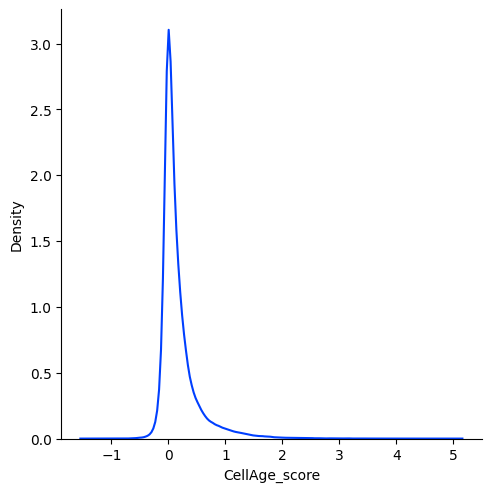

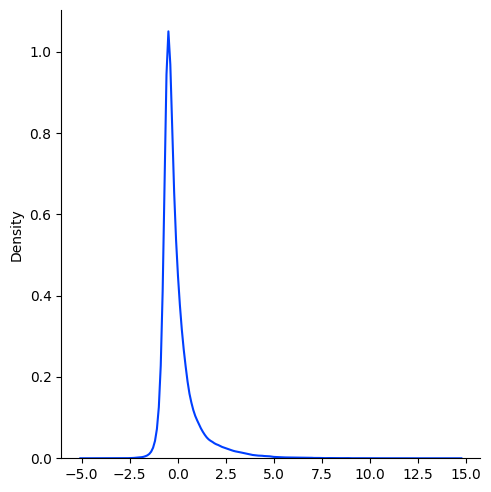


Fractions of cells positive for CellAge is 0.048 or 7437 of 155192
visualizing.

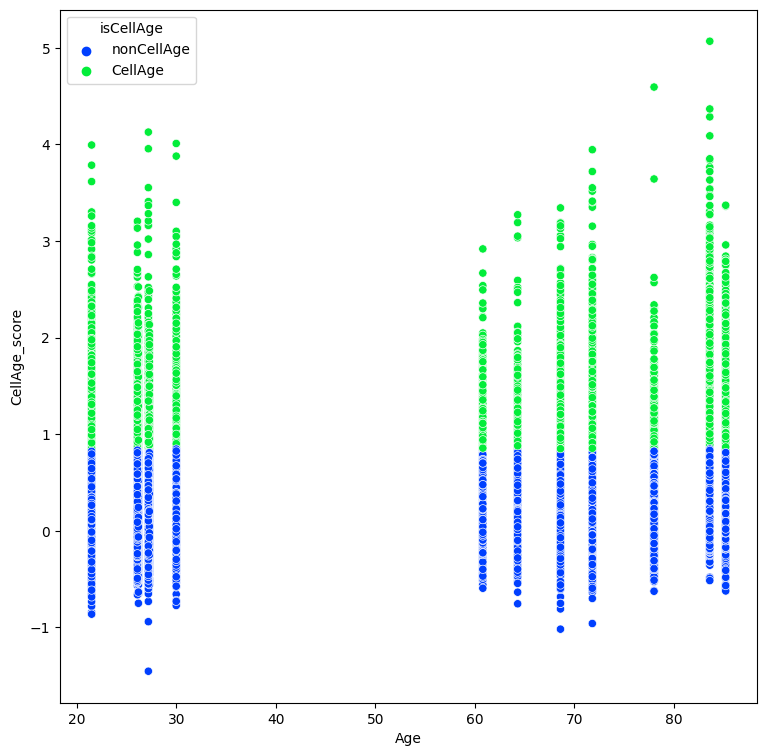

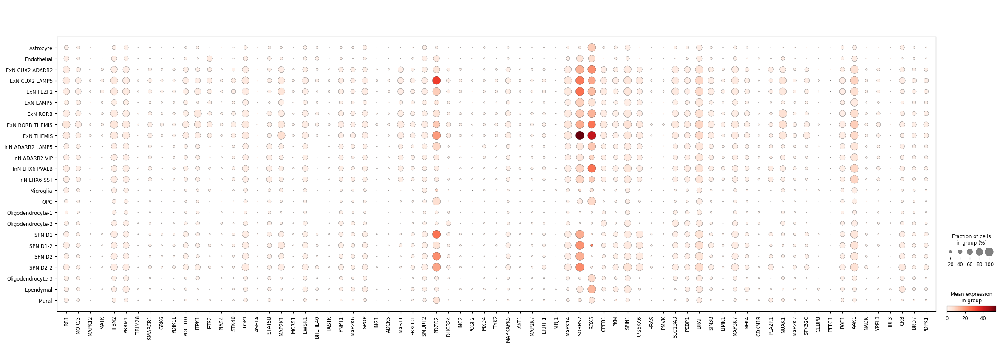

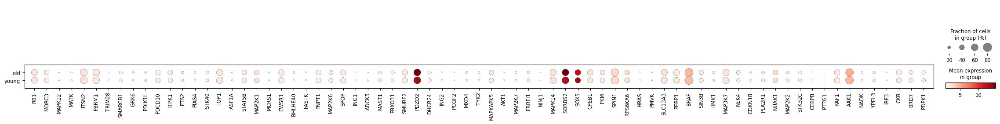

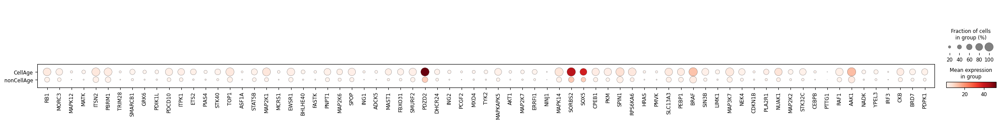

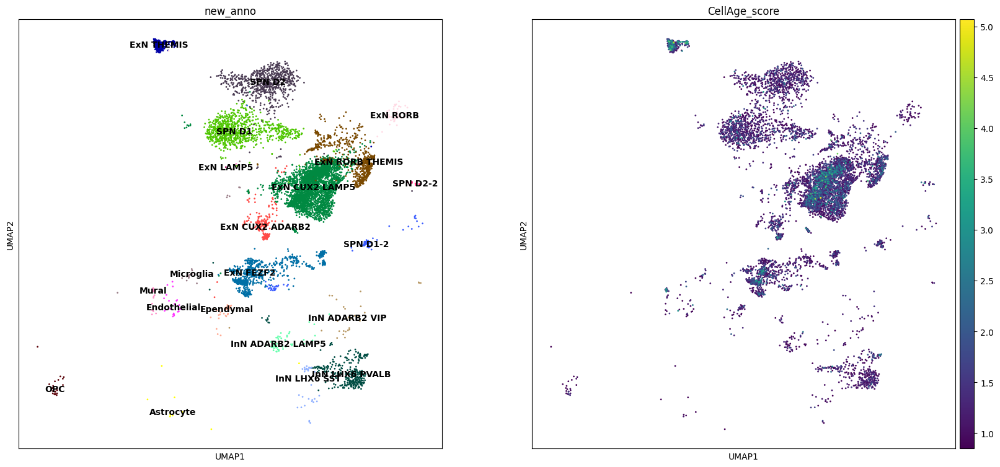

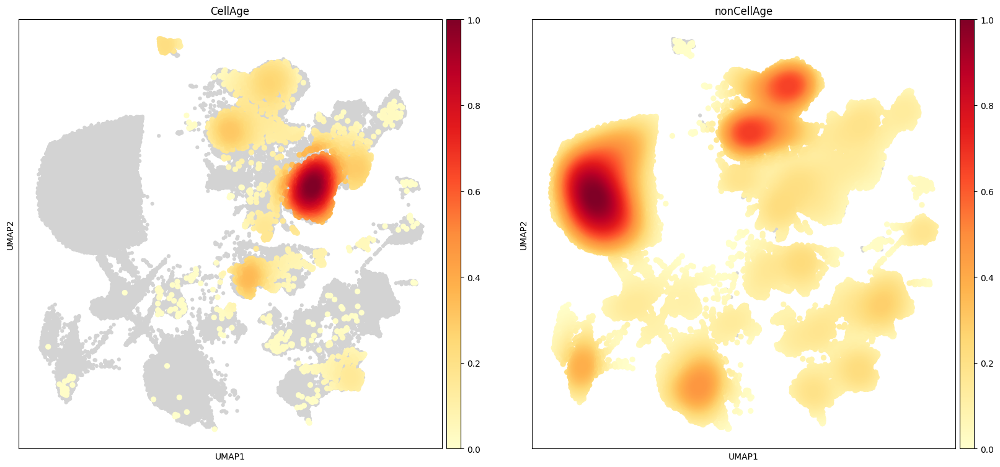

new_anno                     
Astrocyte          nonCellAge    11280
                   CellAge           9
Endothelial        nonCellAge      931
                   CellAge          22
ExN CUX2 ADARB2    nonCellAge     2810
                   CellAge         256
ExN CUX2 LAMP5     nonCellAge     6040
                   CellAge        3015
ExN FEZF2          nonCellAge     6003
                   CellAge         839
ExN LAMP5          nonCellAge     1962
                   CellAge           1
ExN RORB           nonCellAge     1907
                   CellAge          59
ExN RORB THEMIS    nonCellAge     4469
                   CellAge         661
ExN THEMIS         CellAge         304
                   nonCellAge      157
InN ADARB2 LAMP5   nonCellAge     3166
                   CellAge          50
InN ADARB2 VIP     nonCellAge     6984
                   CellAge          30
InN LHX6 PVALB     nonCellAge     4228
                   CellAge         338
InN LHX6 SST       nonCellAge     

Brain_region                     
Entorhinal cortex      nonCellAge    45791
                       CellAge        1765
Middle temporal gyrus  nonCellAge    21455
                       CellAge        3939
Putamen                nonCellAge    45293
                       CellAge        1196
Subventricular zone    nonCellAge    35216
                       CellAge         537
Name: isCellAge, dtype: int64

CPU times: user 16min 23s, sys: 1min 45s, total: 18min 8s
Wall time: 17min 20s


In [18]:
%%time
score_gene_set(adata, 'CellAge', gene_sets['CellAge'], verbose=DEBUG)

### check diff expression by age results

#### load the GLMMTMB results

In [19]:
diff_df = read_csv(glmmtmb_file)
print(f'diff df shape {diff_df.shape}')
if DEBUG:
    display(diff_df.head())

diff df shape (28548, 9)


,feature,intercept,estimate,std.error,statistic,p.value,tissue,type,fdr_bh
0,LINC02593,-6.588815,-1.979733,0.640648,-3.090203,0.002000,Middle temporal gyrus,brain_region,0.031302
1,ISG15,-2.851665,-0.478886,0.168812,-2.836799,0.004557,Middle temporal gyrus,brain_region,0.048795
2,MEGF6,-3.358775,0.310553,0.095130,3.264499,0.001097,Middle temporal gyrus,brain_region,0.022328
3,EPHA8,-4.230609,0.914316,0.303745,3.010140,0.002611,Middle temporal gyrus,brain_region,0.036201
4,ASAP3,-1.604814,0.322646,0.087524,3.686370,0.000227,Middle temporal gyrus,brain_region,0.008847


#### check each gene set in both region and cell-type

In [37]:
results = []
for result_type in ['brain_region', 'broad_type']:
    temp_diff_df = diff_df.loc[diff_df.type == result_type]
    tissues = temp_diff_df.tissue.unique()
    for tissue in tissues:
        for name, gene_set in gene_sets.items():
            # found = temp_diff_df.loc[(temp_diff_df.tissue == tissue) & 
            #                          (temp_diff_df.estimate > 0) & 
            #                          (temp_diff_df.feature.isin(gene_set))]
            # removing restriction that change is increasing
            found = temp_diff_df.loc[(temp_diff_df.tissue == tissue) & 
                                     (temp_diff_df.feature.isin(gene_set))]            
            proportion = round(found.shape[0]/len(gene_set), 3)
            # print(name, gene_set)
            print(result_type, tissue, name, len(gene_set), proportion)
            results.append([result_type, tissue, name, len(gene_set), proportion])

brain_region Middle temporal gyrus DAM 7 0.143
brain_region Middle temporal gyrus CSS 7 0.143
brain_region Middle temporal gyrus CSP 11 0.0
brain_region Middle temporal gyrus SRP 18 0.0
brain_region Middle temporal gyrus SIP 30 0.0
brain_region Middle temporal gyrus CellAge 73 0.014
brain_region Putamen DAM 7 0.143
brain_region Putamen CSS 7 0.143
brain_region Putamen CSP 11 0.0
brain_region Putamen SRP 18 0.111
brain_region Putamen SIP 30 0.0
brain_region Putamen CellAge 73 0.0
brain_region Entorhinal cortex DAM 7 0.0
brain_region Entorhinal cortex CSS 7 0.0
brain_region Entorhinal cortex CSP 11 0.0
brain_region Entorhinal cortex SRP 18 0.056
brain_region Entorhinal cortex SIP 30 0.0
brain_region Entorhinal cortex CellAge 73 0.014
brain_region Subventricular zone DAM 7 0.0
brain_region Subventricular zone CSS 7 0.0
brain_region Subventricular zone CSP 11 0.0
brain_region Subventricular zone SRP 18 0.0
brain_region Subventricular zone SIP 30 0.033
brain_region Subventricular zone CellA

#### format results as dataframe and pivot as necessary

In [38]:
results_df = DataFrame(results, columns=['type', 'tissue', 'score_type', 'score_features', 'fraction'])
print(f'results df shape{results_df.shape}')
if DEBUG:
    display(results_df.head())

results df shape(84, 5)


,type,tissue,score_type,score_features,fraction
0,brain_region,Middle temporal gyrus,DAM,7,0.143
1,brain_region,Middle temporal gyrus,CSS,7,0.143
2,brain_region,Middle temporal gyrus,CSP,11,0.000
3,brain_region,Middle temporal gyrus,SRP,18,0.000
4,brain_region,Middle temporal gyrus,SIP,30,0.000


In [39]:
results_pv = results_df.pivot(index=['type', 'tissue'], columns='score_type', values='fraction')
print(f'result pivot shape {results_pv.shape}')
if DEBUG:
    display(results_pv.head())

result pivot shape (14, 6)


score_type                          CSP    CSS  CellAge    DAM    SIP    SRP
type         tissue                                                         
brain_region Entorhinal cortex      0.0  0.000    0.014  0.000  0.000  0.056
             Middle temporal gyrus  0.0  0.143    0.014  0.143  0.000  0.000
             Putamen                0.0  0.143    0.000  0.143  0.000  0.111
             Subventricular zone    0.0  0.000    0.014  0.000  0.033  0.000
broad_type   Astrocyte              0.0  0.143    0.041  0.000  0.100  0.000

#### visualize the reformated data as a heatmap

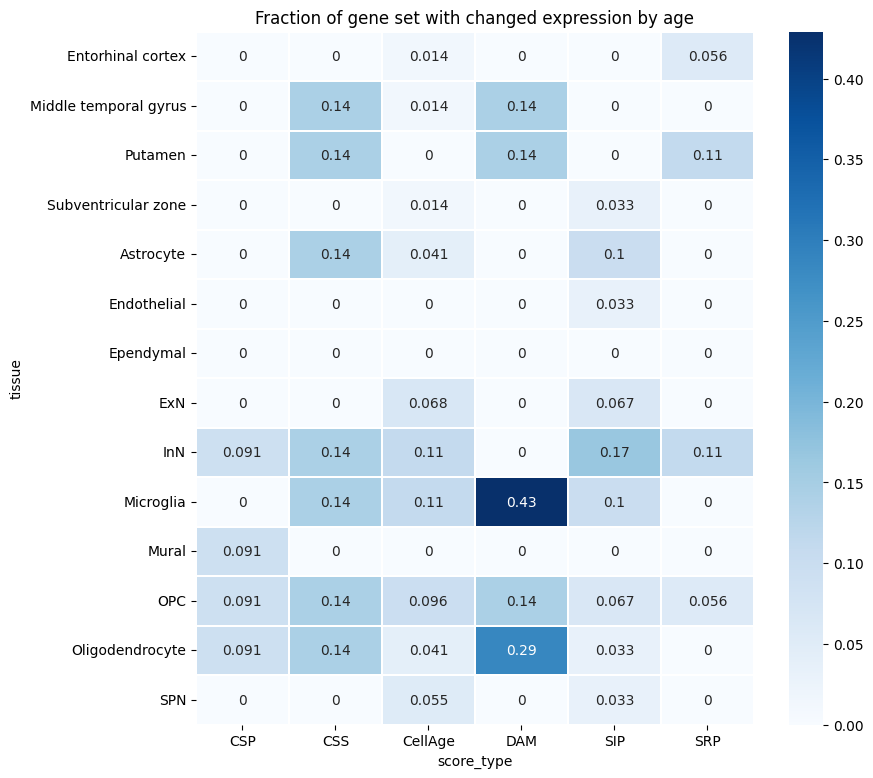

In [41]:
with rc_context({'figure.figsize': (9, 9), 'figure.dpi': 50}):
    plt.style.use('seaborn-bright')    
    heatmap(results_pv.droplevel(0), annot=True, 
            annot_kws={"fontsize":10}, linewidths=0.05, cmap='Blues')    
    plt.title(f'Fraction of gene set with changed expression by age')
    plt.show()

In [36]:
for name, gene_set in gene_sets.items():
    print(name, len(gene_set))

DAM 7
CSS 7
CSP 11
SRP 18
SIP 30
CellAge 73


In [35]:
!date

Wed Nov 30 12:03:47 EST 2022
